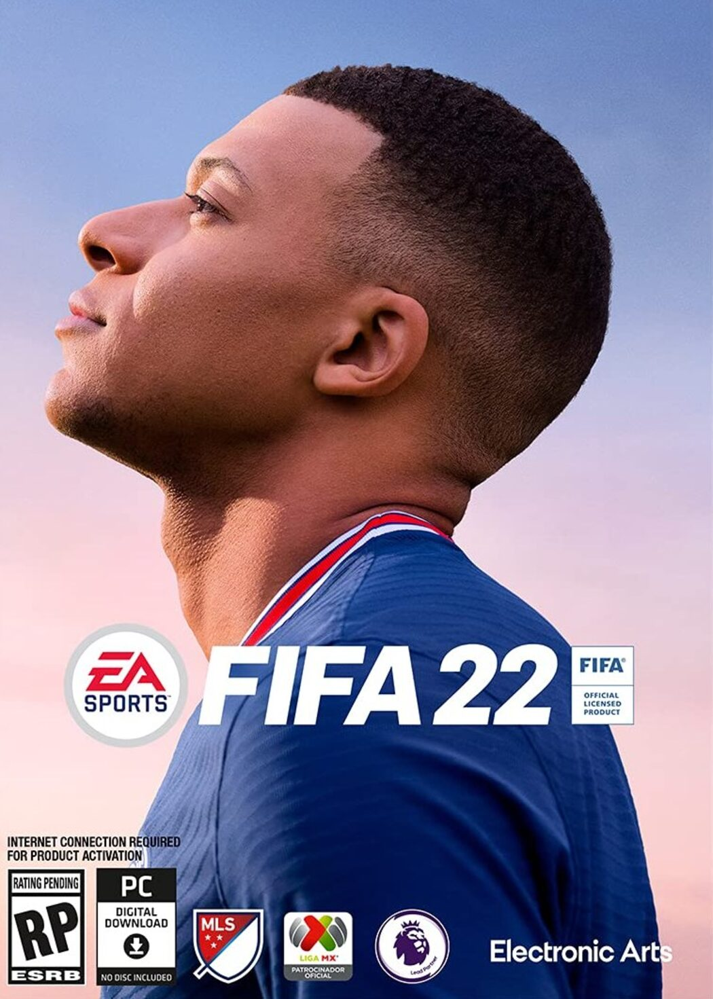

## The dataset includes FIFA 2022 players attributes which are as follows -

>Age, Nationality, Overall, Potential, Club, Value, Wage, Preferred Foot, International Reputation, Weak Foot, Skill Moves, Work Rate, Position, Jersey Number, Joined, Loaned From, Contract Valid Until, Height, Weight, LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, Crossing, Finishing, Heading, Accuracy, ShortPassing, Volleys, Dribbling, Curve, FKAccuracy, LongPassing, BallControl, Acceleration, SprintSpeed, Agility, Reactions, Balance, ShotPower, Jumping, Stamina, Strength, LongShots, Aggression, Interceptions, Positioning, Vision, Penalties, Composure, Marking, StandingTackle, SlidingTackle, GKDiving, GKHandling, GKKicking, GKPositioning, GKReflexes, and Release Clause.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.express as px
plt.style.use('fivethirtyeight')

import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_22.csv')

In [4]:
df.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


In [5]:
df.shape

(19239, 110)

In [6]:
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'lcb', 'cb', 'rcb', 'rb', 'gk', 'player_face_url', 'club_logo_url',
       'club_flag_url', 'nation_logo_url', 'nation_flag_url'],
      dtype='object', length=110)

In [7]:
columns_to_drop = [ 'club_flag_url', 'nation_flag_url', 'player_face_url', 'club_logo_url', 'nation_logo_url', 'sofifa_id', 'player_url', 'long_name', 'real_face', 'club_team_id', 'nation_team_id', 'nation_position', 'nation_jersey_number', 'club_loaned_from', 'club_joined', 'player_tags',  ]
df.drop(columns =columns_to_drop, inplace = True )

In [8]:
df.head()

,short_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,...,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3
1,R. Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,...,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3
2,Cristiano Ronaldo,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,...,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3
3,Neymar Jr,"LW, CAM",91,91,129000000.0,270000.0,29,1992-02-05,175,68,...,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3
4,K. De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,1991-06-28,181,70,...,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3


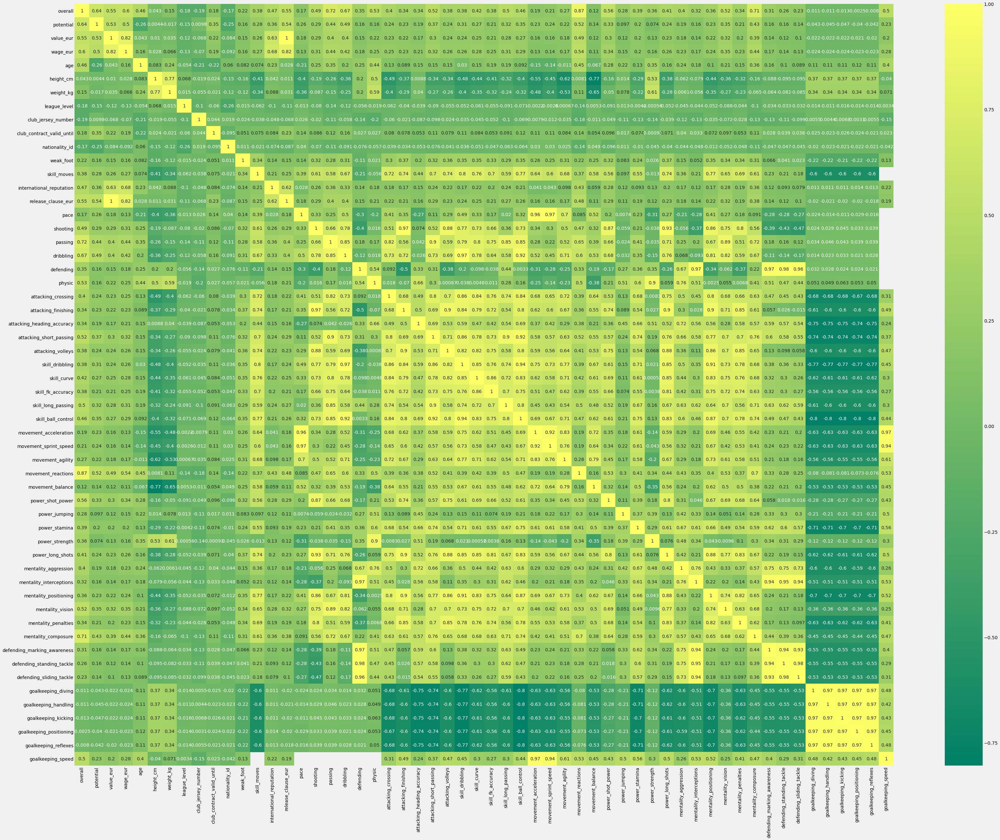

In [9]:
plt.figure(figsize=(50,40))
p = sns.heatmap(df.corr(), annot=True, cmap = "summer")

In [10]:
df['international_reputation'].value_counts()

1    17850
2     1039
3      285
4       57
5        8
Name: international_reputation, dtype: int64

In [11]:
df.columns

Index(['short_name', 'player_positions', 'overall', 'potential', 'value_eur',
       'wage_eur', 'age', 'dob', 'height_cm', 'weight_kg', 'club_name',
       'league_name', 'league_level', 'club_position', 'club_jersey_number',
       'club_contract_valid_until', 'nationality_id', 'nationality_name',
       'preferred_foot', 'weak_foot', 'skill_moves',
       'international_reputation', 'work_rate', 'body_type',
       'release_clause_eur', 'player_traits', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_lon

In [12]:
# check for missing values
for i in df.columns:
    print(i, ' ', df[i].isnull().sum())

short_name   0
player_positions   0
overall   0
potential   0
value_eur   74
wage_eur   61
age   0
dob   0
height_cm   0
weight_kg   0
club_name   61
league_name   61
league_level   61
club_position   61
club_jersey_number   61
club_contract_valid_until   61
nationality_id   0
nationality_name   0
preferred_foot   0
weak_foot   0
skill_moves   0
international_reputation   0
work_rate   0
body_type   0
release_clause_eur   1176
player_traits   9841
pace   2132
shooting   2132
passing   2132
dribbling   2132
defending   2132
physic   2132
attacking_crossing   0
attacking_finishing   0
attacking_heading_accuracy   0
attacking_short_passing   0
attacking_volleys   0
skill_dribbling   0
skill_curve   0
skill_fk_accuracy   0
skill_long_passing   0
skill_ball_control   0
movement_acceleration   0
movement_sprint_speed   0
movement_agility   0
movement_reactions   0
movement_balance   0
power_shot_power   0
power_jumping   0
power_stamina   0
power_strength   0
power_long_shots   0
mentality_a

In [13]:
df.dropna(subset = ['value_eur', 'wage_eur', 'club_name' ], inplace = True)

In [14]:
df['pace'].fillna(df['pace'].mean(), inplace = True)
df['shooting'].fillna(df['shooting'].mean(), inplace = True)
df['passing'].fillna(df['passing'].mean(), inplace = True)
df['dribbling'].fillna(df['dribbling'].mean(), inplace = True)
df['defending'].fillna(df['defending'].mean(), inplace = True)
df['physic'].fillna(df['physic'].mean(), inplace = True)

In [15]:
# check for missing values
for i in df.columns:
    print(i, ' ', df[i].isnull().sum())

short_name   0
player_positions   0
overall   0
potential   0
value_eur   0
wage_eur   0
age   0
dob   0
height_cm   0
weight_kg   0
club_name   0
league_name   0
league_level   0
club_position   0
club_jersey_number   0
club_contract_valid_until   0
nationality_id   0
nationality_name   0
preferred_foot   0
weak_foot   0
skill_moves   0
international_reputation   0
work_rate   0
body_type   0
release_clause_eur   1102
player_traits   9821
pace   0
shooting   0
passing   0
dribbling   0
defending   0
physic   0
attacking_crossing   0
attacking_finishing   0
attacking_heading_accuracy   0
attacking_short_passing   0
attacking_volleys   0
skill_dribbling   0
skill_curve   0
skill_fk_accuracy   0
skill_long_passing   0
skill_ball_control   0
movement_acceleration   0
movement_sprint_speed   0
movement_agility   0
movement_reactions   0
movement_balance   0
power_shot_power   0
power_jumping   0
power_stamina   0
power_strength   0
power_long_shots   0
mentality_aggression   0
mentality_in

In [16]:
df.head()

,short_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,...,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3
1,R. Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,...,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3
2,Cristiano Ronaldo,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,...,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3
3,Neymar Jr,"LW, CAM",91,91,129000000.0,270000.0,29,1992-02-05,175,68,...,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3
4,K. De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,1991-06-28,181,70,...,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3


## Data Visualization
> Distribution of preferred foot

> What is the distribution of preferred foot ?



In [17]:
df['preferred_foot'].value_counts()

Right    14616
Left      4549
Name: preferred_foot, dtype: int64

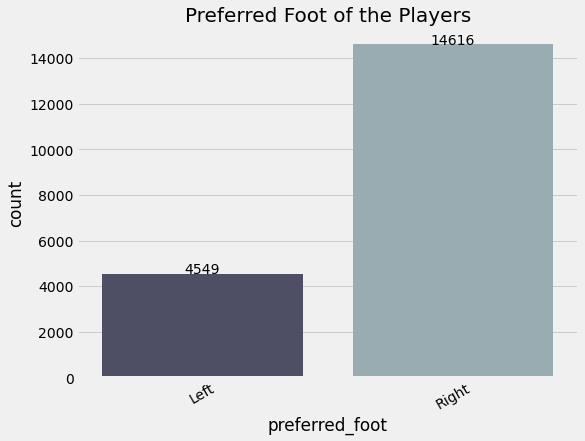

In [18]:

fig, ax = plt.subplots(figsize=(8,6))
graph = sns.countplot(ax=ax,x=df['preferred_foot'], data=df, palette = 'bone')
graph.set_title('Preferred Foot of the Players', fontsize = 20)
graph.set_xticklabels(graph.get_xticklabels(),rotation=30)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

In [19]:
df['preferred_foot'].value_counts()/len(df)

Right    0.76264
Left     0.23736
Name: preferred_foot, dtype: float64

In [20]:
df['preferred_foot'].value_counts()

Right    14616
Left      4549
Name: preferred_foot, dtype: int64

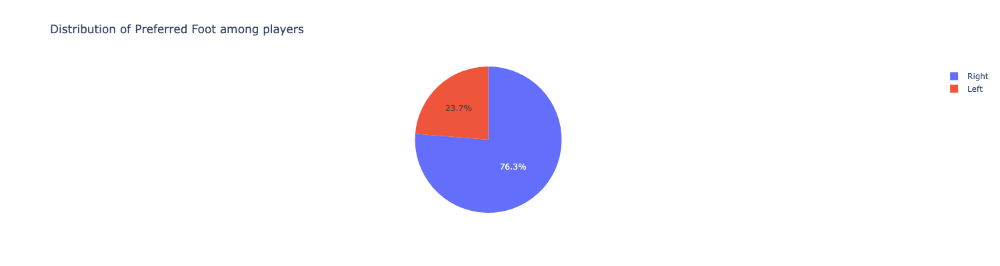

In [21]:
labels = df['preferred_foot'].value_counts().index
size = df['preferred_foot'].value_counts()
g = px.pie(df, values = size, names = labels, width=1000, height=400, title='Distribution of Preferred Foot among players')
g.show()

## Distribution of weak foot
>Q. What is the distribution of weak foot ?

>A. The distribution of weak foot can be obtained as follows -

In [22]:
df['weak_foot'].value_counts()

3    11784
2     4141
4     2800
5      295
1      145
Name: weak_foot, dtype: int64

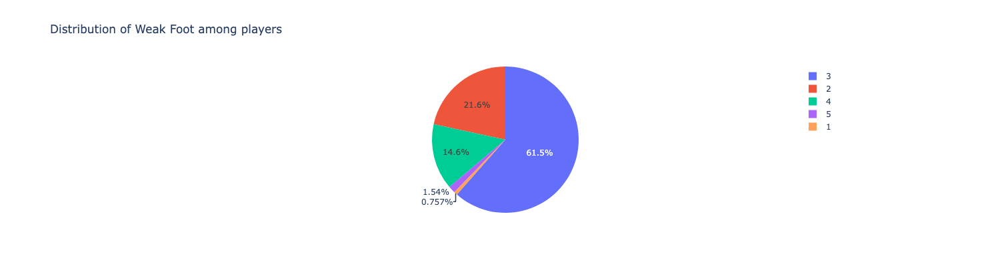

In [23]:
labels = df['weak_foot'].value_counts().index
size = df['weak_foot'].value_counts()
g = px.pie(df, values = size, names = labels, width=1000, height=400, title='Distribution of Weak Foot among players')
g.show()

## Age distribution of players
>Q. How can we visualize the age distribution of players.

>A. We can use a histogram to visualize the age distribution of players.



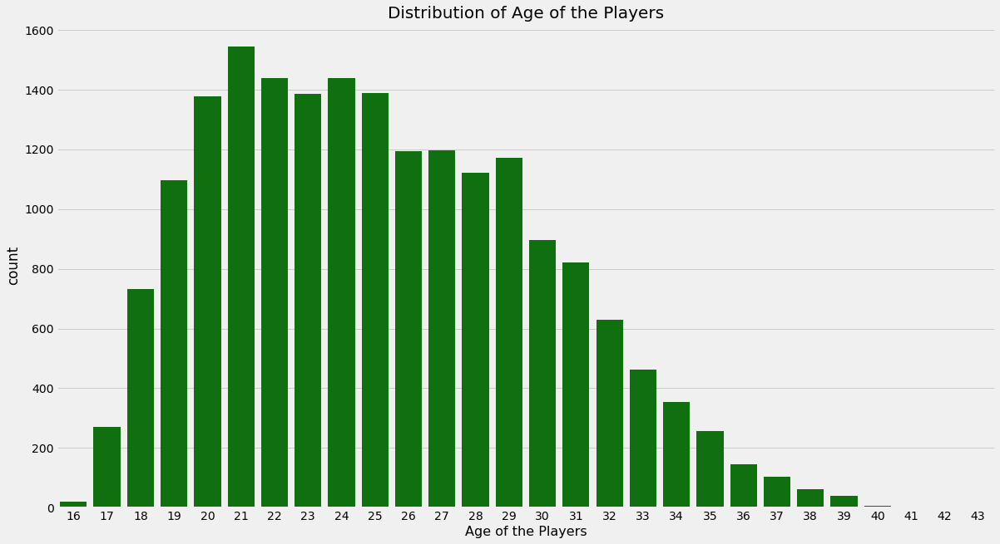

In [24]:
x = df['age']
plt.figure(figsize=(18,10))
ax = sns.countplot(x, color='g')
ax.set_xlabel(xlabel = 'Age of the Players', fontsize = 16)
ax.set_title(label = 'Distribution of Age of the Players', fontsize = 20)
plt.show()


## Potential Score of the Players

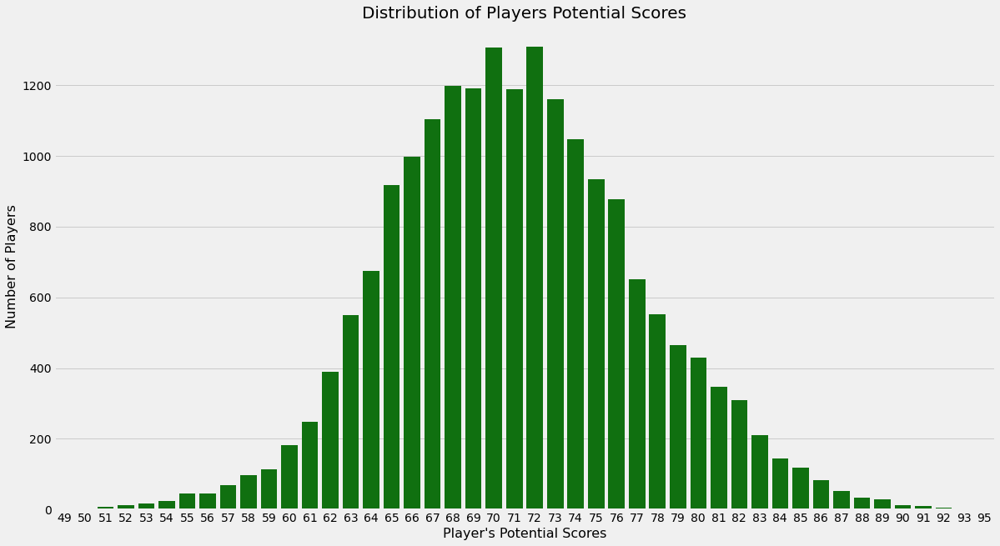

In [25]:
x = df['potential']
plt.figure(figsize=(18,10))
ax = sns.countplot(x, color='g')
ax.set_xlabel(xlabel = "Player's Potential Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Distribution of Players Potential Scores', fontsize = 20)
plt.show()

## Overall Score of the Players


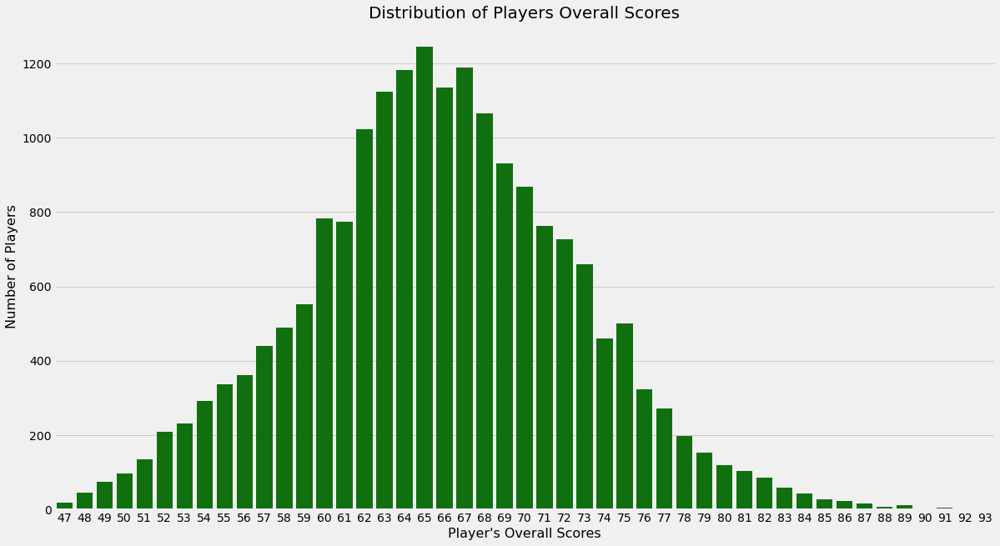

In [26]:
x = df['overall']
plt.figure(figsize=(18,10))
ax = sns.countplot(x, color='g')
ax.set_xlabel(xlabel = "Player's Overall Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Distribution of Players Overall Scores', fontsize = 20)
plt.show()

## Count of Players with Positions

> since most players plays more than one position and we also want to put each position they are playing to be captured

In [27]:
df.head()

,short_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,...,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3
1,R. Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,...,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3
2,Cristiano Ronaldo,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,...,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3
3,Neymar Jr,"LW, CAM",91,91,129000000.0,270000.0,29,1992-02-05,175,68,...,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3
4,K. De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,1991-06-28,181,70,...,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3


In [28]:
all_positions = []
count = []


for position in df['player_positions'].map( lambda x: x.split(',')):
    combined_position = ''.join(position)
    if len(combined_position) > 3:
        for position in position:
            position = position.replace(" ", "")
            if position not in all_positions:
                all_positions.append(position)
                count.append(1)
            else:
                all_positions_index =  all_positions.index(position)
                count[all_positions_index] += 1
    else:
        position = position[0]
        if position not in all_positions:
            all_positions.append(position)
            count.append(1)
        else:
            all_positions_index =  all_positions.index(position)
            count[all_positions_index] += 1
position = pd.DataFrame({'Position': all_positions, 'Count': count}).sort_values( by = 'Count', ascending = False)

In [29]:
position['perectage'] = position['Count']/position['Count'].sum()

In [30]:
position

,Position,Count,perectage
5,CM,4191,0.131689
9,CB,4002,0.125750
1,ST,3385,0.106363
7,CDM,3003,0.094360
8,LM,2511,0.078900
11,RM,2425,0.076198
4,CAM,2250,0.070699
6,GK,2124,0.066740
10,RB,2122,0.066677
12,LB,2097,0.065892


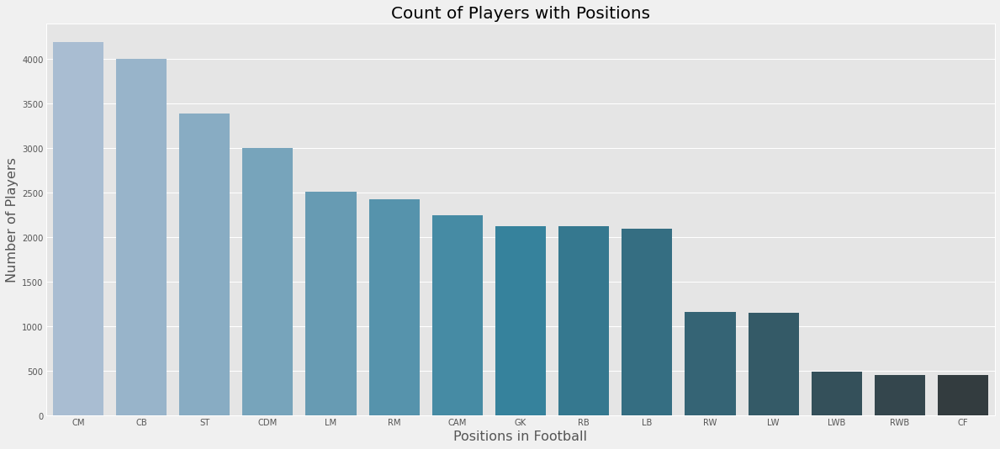

In [31]:
plt.figure(figsize = (18, 8))
plt.style.use('ggplot')
ax = sns.barplot(x = 'Position', y = 'Count', data = position, palette = 'PuBuGn_d')
ax.set_xlabel(xlabel = 'Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Count of Players with Positions', fontsize = 20)
plt.show()

>The plot above shows that the most position played is Central midfield with 4191 and centre forward the least postion with players with 451 players

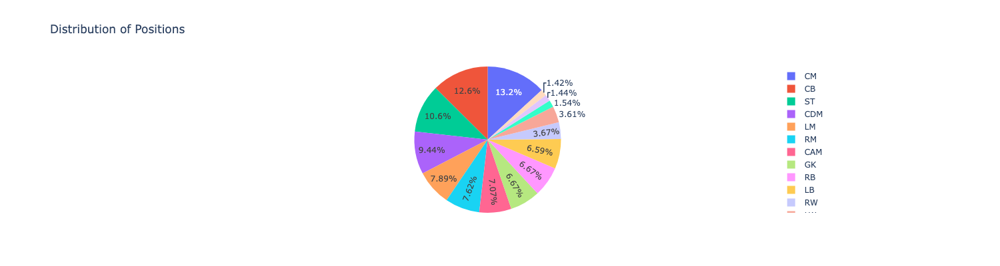

In [32]:
labels = position['Position']
size = position['Count']
g = px.pie(position, values = size, names = labels, width=1000, height=400, title='Distribution of Positions')
g.show()

In [34]:
top_countries = df['nationality_name'].value_counts().head(100)

top_countries

England       1717
Germany       1214
Spain         1085
France         980
Argentina      956
              ... 
Zambia           9
Lithuania        9
Azerbaijan       8
Comoros          8
Madagascar       8
Name: nationality_name, Length: 100, dtype: int64

## Nationality of player

In [35]:
name_of_top_countries = top_countries.index

name_of_top_countries

Index(['England', 'Germany', 'Spain', 'France', 'Argentina', 'Brazil', 'Japan',
       'Netherlands', 'United States', 'Poland', 'Sweden', 'China PR',
       'Norway', 'Republic of Ireland', 'Portugal', 'Saudi Arabia', 'Mexico',
       'Italy', 'Romania', 'Korea Republic', 'Colombia', 'Belgium', 'Austria',
       'Denmark', 'Scotland', 'Turkey', 'Uruguay', 'Australia', 'India',
       'Venezuela', 'Paraguay', 'Switzerland', 'Ecuador', 'Chile', 'Peru',
       'Croatia', 'Bolivia', 'Wales', 'Ghana', 'Senegal', 'Nigeria', 'Serbia',
       'Côte d'Ivoire', 'Czech Republic', 'Morocco', 'Greece', 'Russia',
       'Northern Ireland', 'Canada', 'Bosnia and Herzegovina', 'Ukraine',
       'Cameroon', 'South Africa', 'Slovakia', 'Finland', 'Mali', 'Iceland',
       'Congo DR', 'Slovenia', 'Algeria', 'Kosovo', 'Albania', 'Hungary',
       'Jamaica', 'Guinea', 'Tunisia', 'New Zealand', 'North Macedonia',
       'Gambia', 'Georgia', 'Bulgaria', 'Montenegro', 'Costa Rica',
       'Guinea Bissau', 'I

In [36]:
df['nationality_name'].nunique()

163

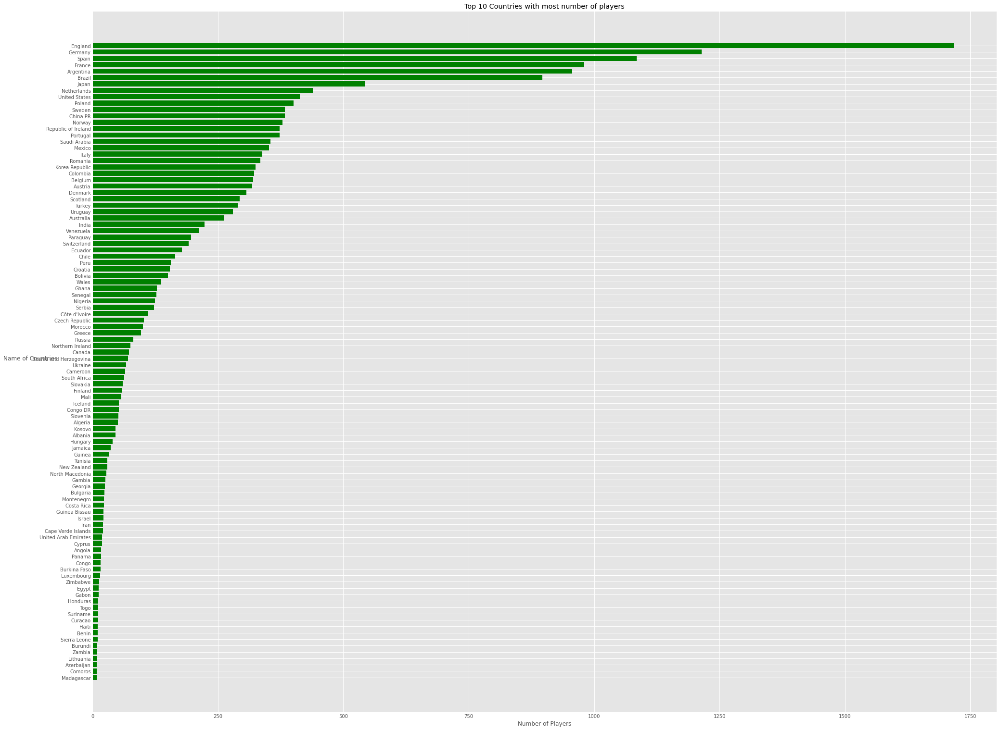

In [37]:
fig, ax = plt.subplots(figsize=(30,25))
x = top_countries.values
y = top_countries.index
ax.barh(y, x, align='center', color='green')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Players')
ax.set_ylabel('Name of Countries', rotation=0)
ax.set_title('Top 10 Countries with most number of players')
plt.show()

## Age distribution of Players of Top Countries

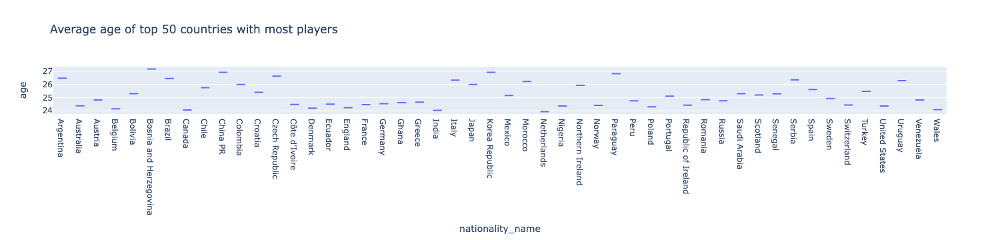

In [39]:

average_age_nationality = df[df['nationality_name'].isin(df.nationality_name.value_counts().head(50).index)].groupby('nationality_name', as_index = False)['age'].mean()
px.box( average_age_nationality , x = 'nationality_name', y = 'age', title='Average age of top 50 countries with most players' )

> Q. which country has the youngest and oldest players on average

In [40]:
average_age_nationality

,nationality_name,age
0,Argentina,26.472803
1,Australia,24.377863
2,Austria,24.817610
3,Belgium,24.156250
4,Bolivia,25.300000
5,Bosnia and Herzegovina,27.169014
6,Brazil,26.454849
7,Canada,24.068493
8,Chile,25.751515
9,China PR,26.919271


> for the top 50 country with the most players,  it can be seen that Bosnia has the oldest team, followed by china and Korea Republic and Paraguay while Netherland has the yougest team

## AVERAGE POTENTIAL OF PLAYERS FOR EACH COUNTRIES

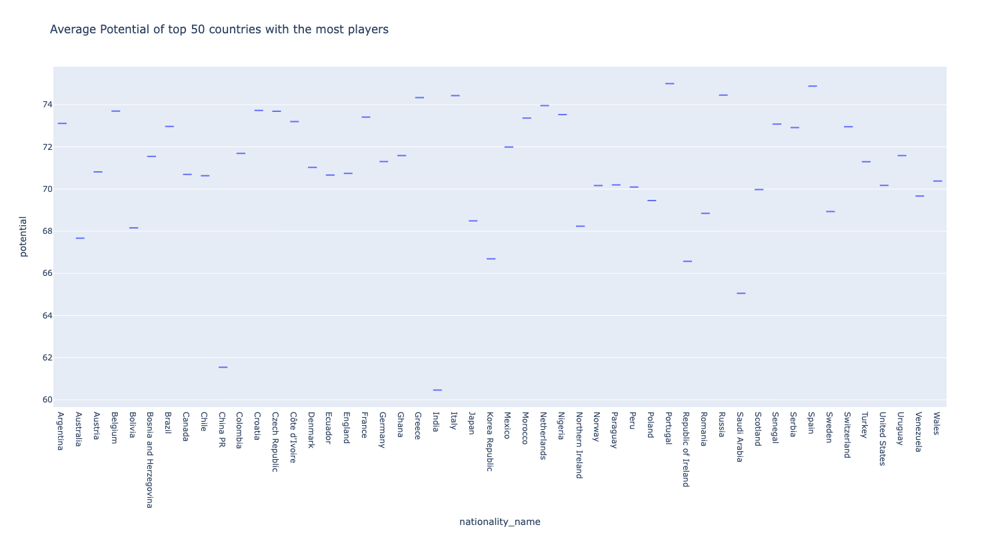

In [42]:
average_potential_nationality = df[df['nationality_name'].isin(df.nationality_name.value_counts().head(50).index)].groupby('nationality_name', as_index = False)['potential'].mean()
px.box( average_potential_nationality , x = 'nationality_name', y = 'potential', title='Average Potential of top 50 countries with the most players' , width = 1600, height = 800)

In [43]:
average_potential_nationality

,nationality_name,potential
0,Argentina,73.111925
1,Australia,67.671756
2,Austria,70.811321
3,Belgium,73.696875
4,Bolivia,68.160000
5,Bosnia and Herzegovina,71.549296
6,Brazil,72.971014
7,Canada,70.698630
8,Chile,70.636364
9,China PR,61.541667


>it can be seen that for counties with at least 50 players, Indian players has least potential on average with 60, followed by China with 62 and Saudi Arabia with 65, republic of Ireland and Korea Republic with 67, and sweden, Japan, Bolivia and  Northern Ireland with 68, and Austria with 69 making the country with the least potential on average
 while Portugese Players has the Highest Potential followed by Spanish and Italian players

## ANALYSIS OF TOP CLUBS

In [44]:
df['club_name'].nunique()

701

>There are 701 unique clubs in the data

In [45]:
top_clubs = ['Liverpool','Manchester United', 'Chelsea','Arsenal','Manchester City','Paris Saint-Germain' ,'FC Bayern München','FC Barcelona','Juventus',
             'Atlético de Madrid', 'Tottenham Hotspur', 'Real Madrid CF', 'Borussia Dortmund', 'Inter', 'Napoli', 'AC Milan']


In [46]:
average_age_count = df[df['club_name'].isin(top_clubs)].groupby('club_name', as_index = False)['age'].mean()

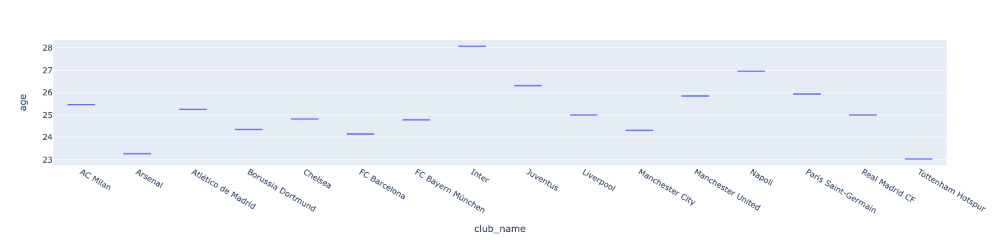

In [47]:
px.box( average_age_count, x = 'club_name', y = 'age' )

> >It can be seen that ot of the top clubs, Inter, followed by Napoli has oldest  oldest squad, while Arsenal Tottenham has the youngest squad

In [48]:
club_value = df[df['club_name'].isin(top_clubs)].groupby('club_name', as_index = False)['value_eur'].sum()

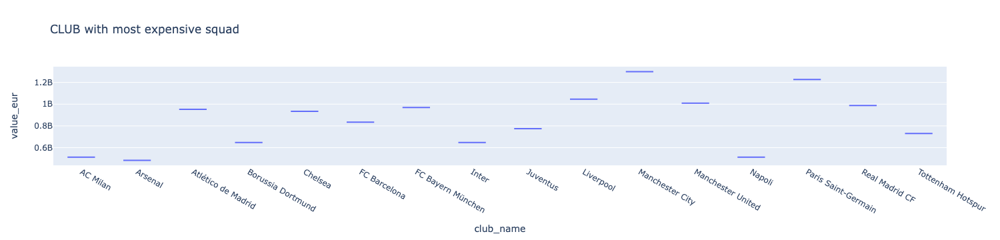

In [49]:
px.box( club_value, x = 'club_name', y = 'value_eur', title = 'CLUB with most expensive squad' )

>In terms of total player value of TOP CLUBS, Machester city has the Most expensive squad, followed by PSG, while Arsenal has the least expensive squad followed by AC milsn

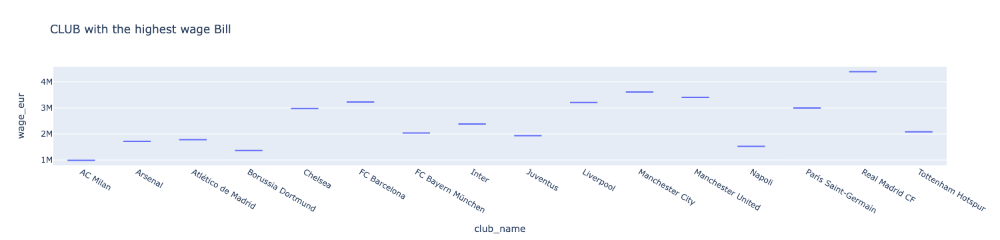

In [50]:
club_wage = df[df['club_name'].isin(top_clubs)].groupby('club_name', as_index = False)['wage_eur'].sum()
px.box( club_wage, x = 'club_name', y = 'wage_eur', title = 'CLUB with the highest wage Bill' )

> out of the Top clubs, Real Mdrid has the highest wage bill with over 4M euros weekly followed by Mancity with 3.6M and ManUnited with 3.4 Euros, while AC milan has the least wage bill 986K weekly wage bill, followed by Dortmund with 1.3M

In [51]:
club_wage

,club_name,wage_eur
0,AC Milan,986000.0
1,Arsenal,1719500.0
2,Atlético de Madrid,1784500.0
3,Borussia Dortmund,1364000.0
4,Chelsea,2978000.0
5,FC Barcelona,3230000.0
6,FC Bayern München,2036000.0
7,Inter,2384000.0
8,Juventus,1936000.0
9,Liverpool,3211000.0


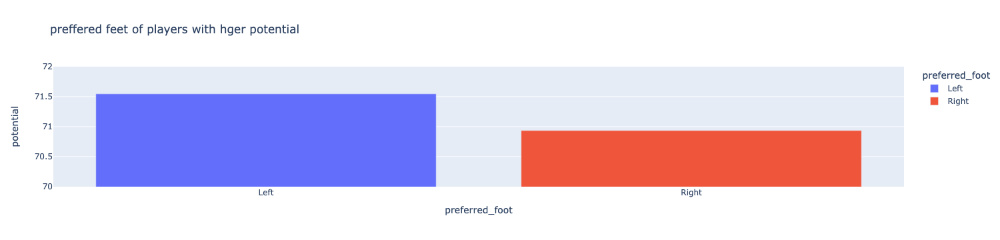

In [52]:
t = df.groupby('preferred_foot', as_index = False)['potential'].mean()
g = px.bar( t, x = 'preferred_foot', y = 'potential', title = 'preffered feet of players with hger potential', color='preferred_foot' )
g.update(layout_yaxis_range= [70,72])

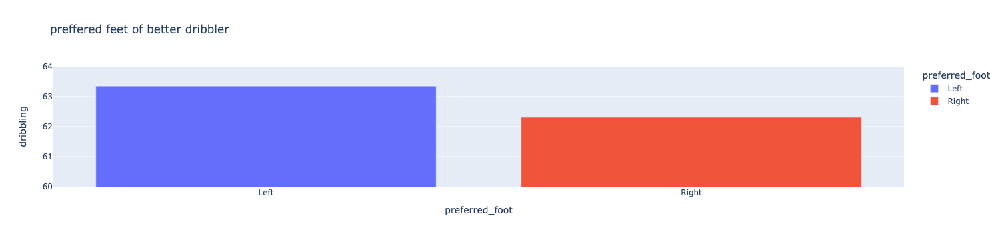

In [53]:
t = df.groupby('preferred_foot', as_index = False)['dribbling'].mean()
g = px.bar( t, x = 'preferred_foot', y = 'dribbling', title = 'preffered feet of better dribbler', color='preferred_foot' )
g.update(layout_yaxis_range= [60,64])

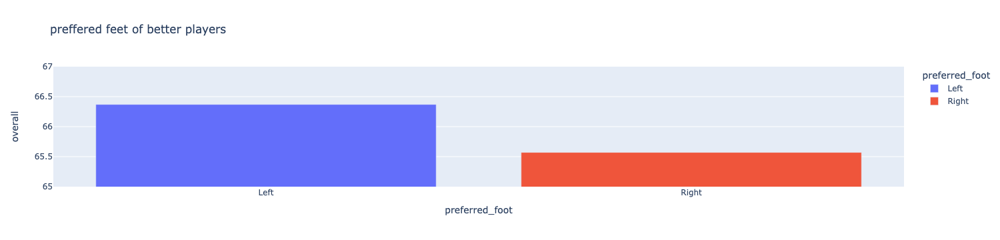

In [54]:
t = df.groupby('preferred_foot', as_index = False)['overall'].mean()
g = px.bar( t, x = 'preferred_foot', y = 'overall', title = 'preffered feet of better players', color='preferred_foot' )
g.update(layout_yaxis_range= [65,67])

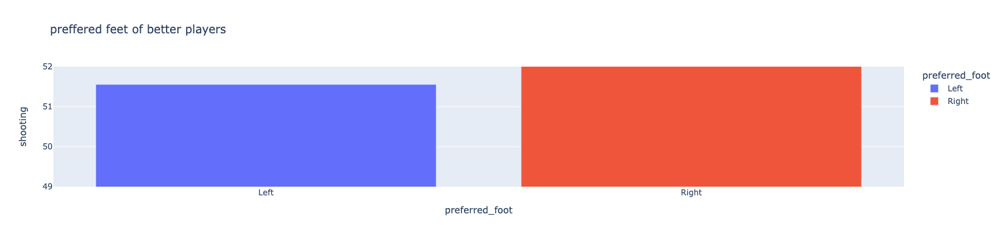

In [55]:
t = df.groupby('preferred_foot', as_index = False)['shooting'].mean()
g = px.bar( t, x = 'preferred_foot', y = 'shooting', title = 'preffered feet of better players', color='preferred_foot' )
g.update(layout_yaxis_range= [49, 52])

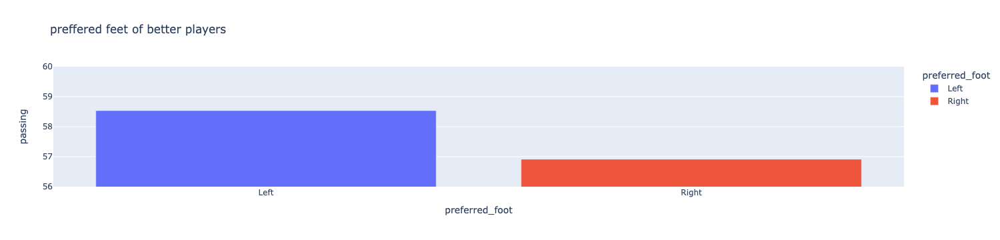

In [56]:
t = df.groupby('preferred_foot', as_index = False)['passing'].mean()
g = px.bar( t, x = 'preferred_foot', y = 'passing', title = 'preffered feet of better players', color='preferred_foot' )
g.update(layout_yaxis_range= [56, 60])

>it shows left footed players has higher potential/overall, passing and dribbling thAN RIGHT FOOTED PLAYERS, but right footed Players has more shooting power 

## ANALYSING TOP LEAGUE

In [57]:
df.league_name.nunique()

55

> there are 55 league in the Data, but we will coniser only the 5 major leagues

In [58]:
top_league = ['French Ligue 1', 'German 1. Bundesliga', 'English Premier League', 'Spain Primera Division', 'Italian Serie A' ]

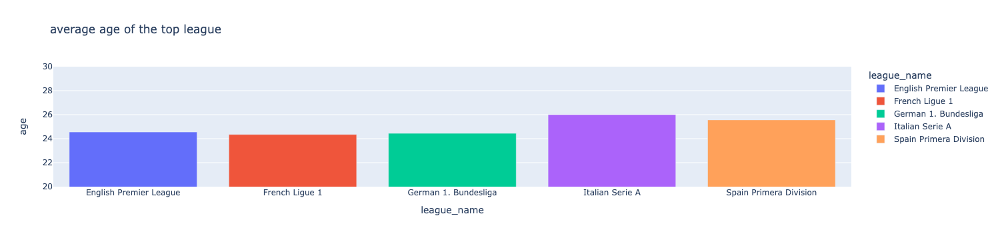

In [59]:
average_age = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['age'].mean()
g = px.bar( average_age, x = 'league_name', y = 'age', title = 'average age of the top league', color='league_name' )
g.update(layout_yaxis_range= [20,30])

>The Italian Seria A turns out to be the league with the oldest player on average(😀as we are all expecting), while the french Ligue has the youngest players on average

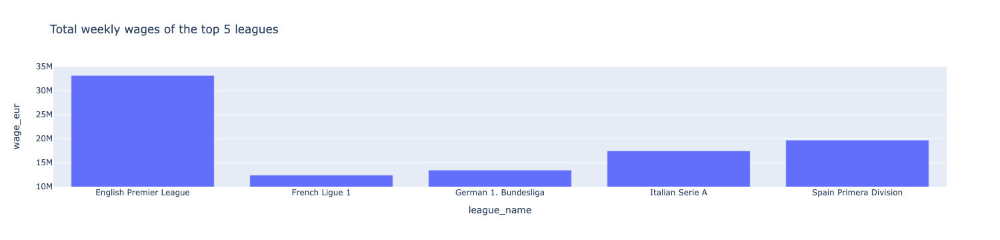

In [60]:
wage = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['wage_eur'].sum()
g = px.bar( wage, x = 'league_name', y = 'wage_eur', title = 'Total weekly wages of the top 5 leagues')
g.update(layout_yaxis_range= [10000000,35000000])

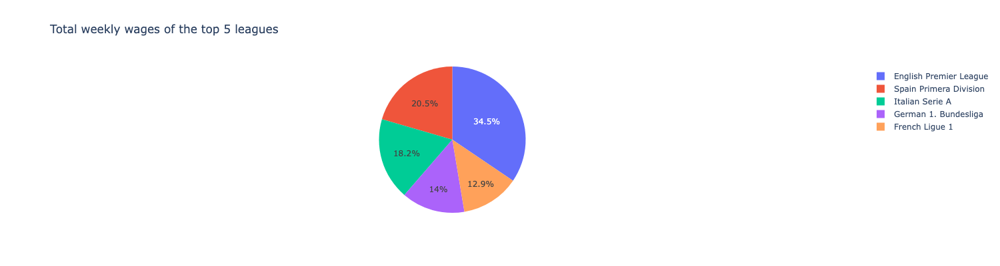

In [61]:
labels = wage['league_name']
size = wage['wage_eur']
g = px.pie(df, values = size, names = labels, width=1000, height=400, title = 'Total weekly wages of the top 5 leagues')
g.show()

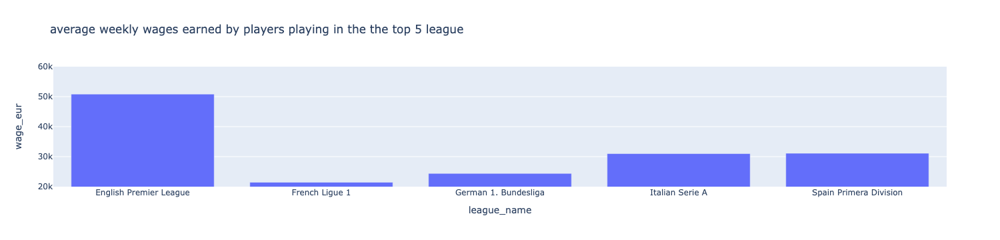

In [62]:
wage_avg = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['wage_eur'].mean()
g = px.bar( wage_avg, x = 'league_name', y = 'wage_eur', title = 'average weekly wages earned by players playing in the the top 5 league' )
g.update(layout_yaxis_range= [20000,60000])

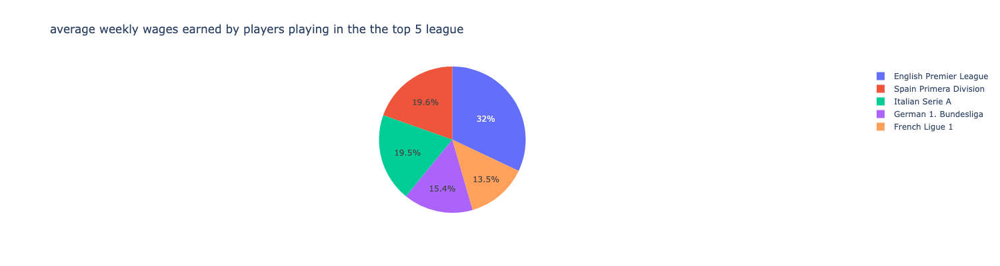

In [63]:
labels = wage_avg['league_name']
size = wage_avg['wage_eur']
g = px.pie(df, values = size, names = labels, width=1000, height=400, title = 'average weekly wages earned by players playing in the the top 5 league')
g.show()

>EPL turns to pay players more than the other major leagues, while French Ligue 1 pays the least

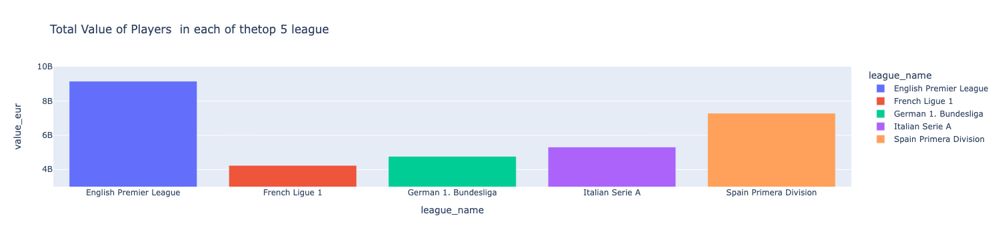

In [64]:
value = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['value_eur'].sum()
g = px.bar( value, x = 'league_name', y = 'value_eur', title = 'Total Value of Players  in each of thetop 5 league', color='league_name' )
g.update(layout_yaxis_range= [3000000000,10000000000])

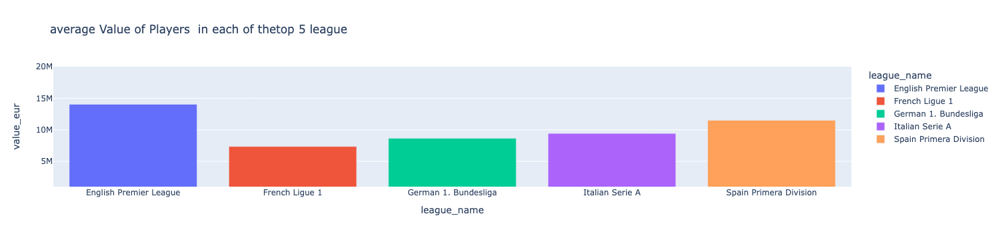

In [65]:
value_avg = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['value_eur'].mean()
g = px.bar( value_avg, x = 'league_name', y = 'value_eur', title = 'average Value of Players  in each of thetop 5 league', color='league_name' )
g.update(layout_yaxis_range= [1000000,20000000])

>EPL is the league with the highest total value of players, it also tops as the league with the average value with player of 14M euros on average

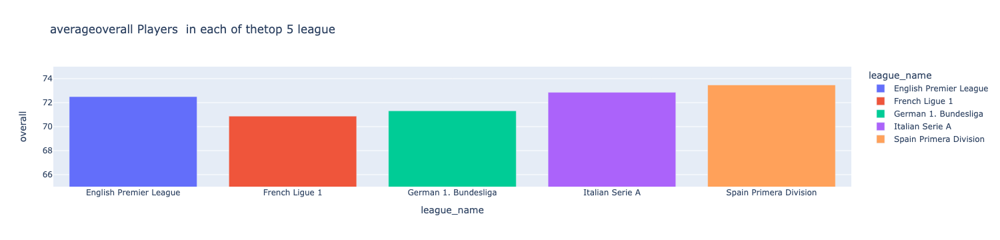

In [66]:
overall = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['overall'].mean()
g = px.bar( overall, x = 'league_name', y = 'overall', title = 'averageoverall Players  in each of thetop 5 league', color='league_name' )
g.update(layout_yaxis_range= [65,75])

>players playing in spanish league tends to have highest overall than other major league

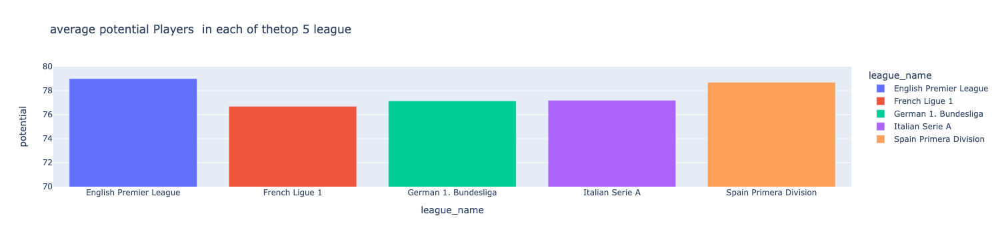

In [67]:
potential = df[df['league_name'].isin(top_league)].groupby('league_name', as_index = False)['potential'].mean()
g = px.bar( potential, x = 'league_name', y = 'potential', title = 'average potential Players  in each of thetop 5 league', color='league_name' )
g.update(layout_yaxis_range= [70,80])

>players playing in EPL has the highest Potential on average while players in the french Ligue 1 has the least avreage potential of the 5  major league 

## Profiling top players
> The top Best Players


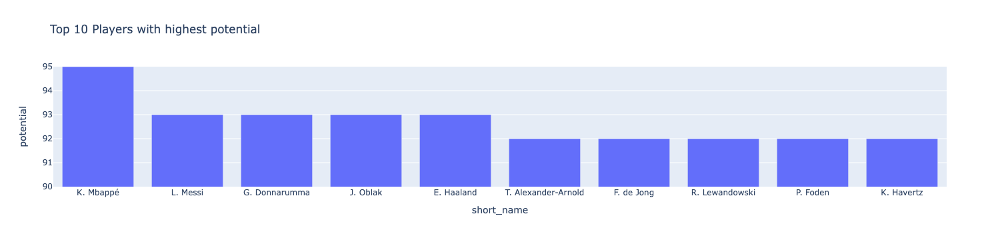

<Figure size 864x432 with 0 Axes>

In [68]:
df_highest_potential = pd.DataFrame.copy(df.sort_values(by ='potential',ascending = False ).head(10))
plt.figure(1,figsize = (12,6))
g = px.bar(df_highest_potential, x ='short_name' , y = 'potential', title = 'Top 10 Players with highest potential')
g.update(layout_yaxis_range= [90,95])

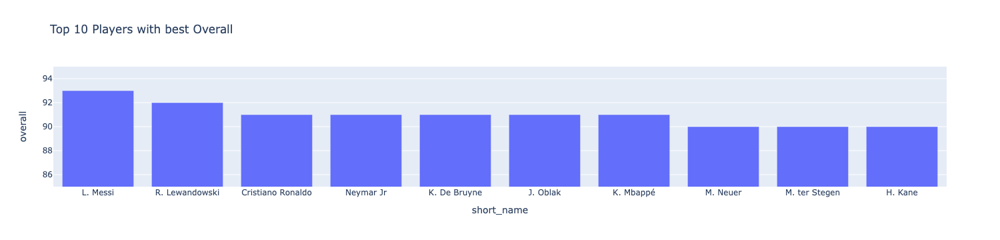

<Figure size 864x432 with 0 Axes>

In [69]:
df_best_players = pd.DataFrame.copy(df.sort_values(by ='overall',ascending = False ).head(10))
plt.figure(1,figsize = (12,6))
g = px.bar(df_best_players, x ='short_name' , y = 'overall', title = 'Top 10 Players with best Overall')
g.update(layout_yaxis_range= [85,95])

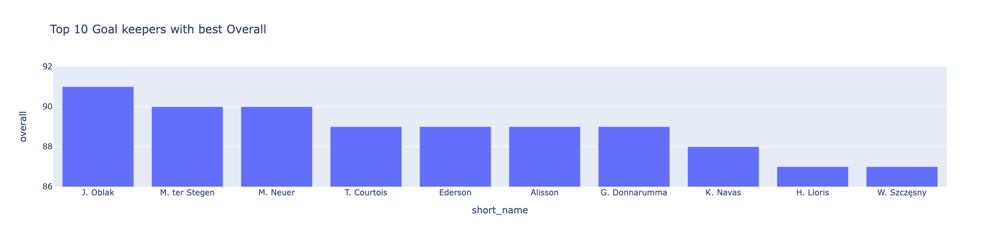

<Figure size 864x432 with 0 Axes>

In [70]:
df_best_gk = pd.DataFrame.copy(df[df['player_positions'] =='GK'].sort_values(by ='overall',ascending = False ).head(10))
plt.figure(1,figsize = (12,6))
g = px.bar(df_best_gk, x ='short_name' , y = 'overall', title = 'Top 10 Goal keepers with best Overall')
g.update(layout_yaxis_range= [86,92])

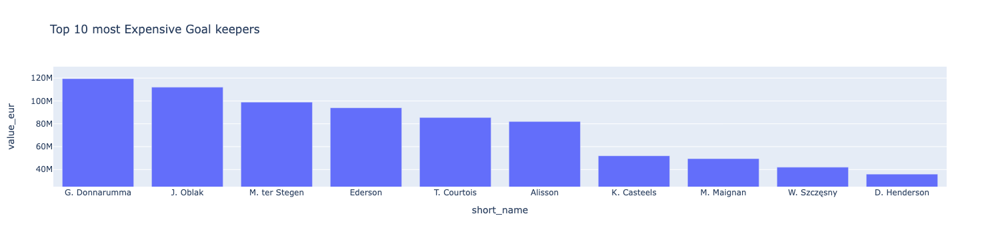

<Figure size 864x432 with 0 Axes>

In [71]:
gk_value = pd.DataFrame.copy(df[df['player_positions'] =='GK'].sort_values(by ='value_eur',ascending = False ).head(10))
plt.figure(1,figsize = (12,6))
g = px.bar(gk_value, x ='short_name' , y = 'value_eur', title = 'Top 10 most Expensive Goal keepers')
g.update(layout_yaxis_range= [25000000, 130000000])

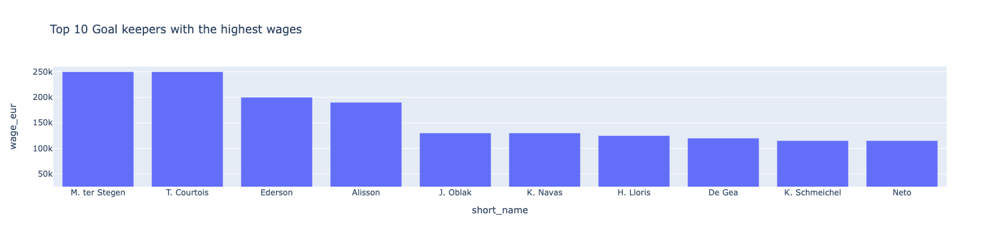

<Figure size 864x432 with 0 Axes>

In [72]:
gk_wage = pd.DataFrame.copy(df[df['player_positions'] =='GK'].sort_values(by ='wage_eur',ascending = False ).head(10))
plt.figure(1,figsize = (12,6))
g = px.bar(gk_wage, x ='short_name' , y = 'wage_eur', title = 'Top 10 Goal keepers with the highest wages')
g.update(layout_yaxis_range= [25000, 260000])

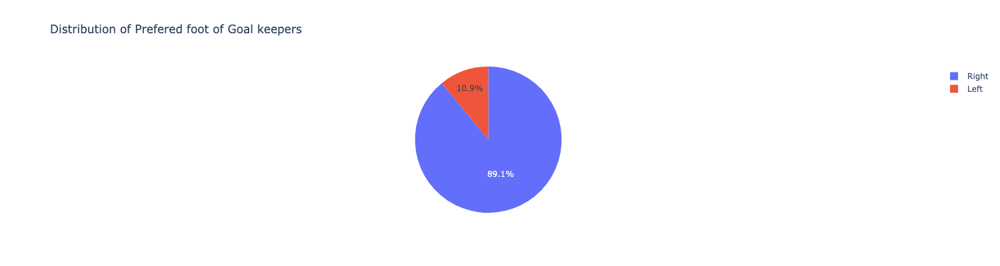

In [74]:
gk_feet = df[df['player_positions'] =='GK']
labels = gk_feet['preferred_foot'].value_counts().index
size = gk_feet['preferred_foot'].value_counts()
g = px.pie(gk_feet, values = size, names = labels, width=1000, height=400, title='Distribution of Prefered foot of Goal keepers')
g.show()

## The Highest Earners
> Q. Who are the highest earners?

In [75]:
wage = df.sort_values(by = 'wage_eur' , ascending = False)[['short_name','club_name','nationality_name','overall',
'age','wage_eur']].head(10)
wage

,short_name,club_name,nationality_name,overall,age,wage_eur
11,K. Benzema,Real Madrid CF,France,89,33,350000.0
4,K. De Bruyne,Manchester City,Belgium,91,30,350000.0
0,L. Messi,Paris Saint-Germain,Argentina,93,34,320000.0
24,T. Kroos,Real Madrid CF,Germany,88,31,310000.0
14,Casemiro,Real Madrid CF,Brazil,89,29,310000.0
27,R. Sterling,Manchester City,England,88,26,290000.0
1,R. Lewandowski,FC Bayern München,Poland,92,32,270000.0
16,S. Mané,Liverpool,Senegal,89,29,270000.0
17,M. Salah,Liverpool,Egypt,89,29,270000.0
3,Neymar Jr,Paris Saint-Germain,Brazil,91,29,270000.0


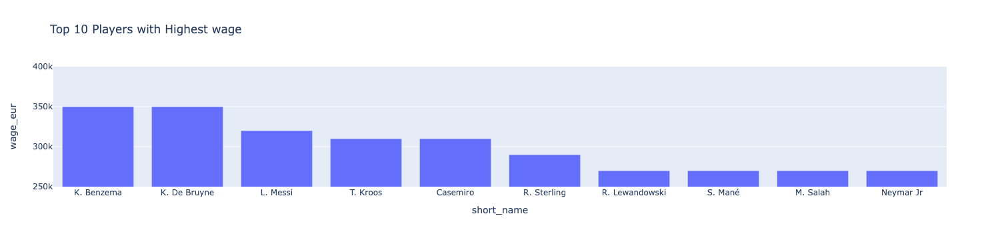

<Figure size 864x432 with 0 Axes>

In [76]:

plt.figure(1,figsize = (12,6))
g = px.bar(wage, x ='short_name' , y = 'wage_eur', title = 'Top 10 Players with Highest wage')
g.update(layout_yaxis_range= [250000,400000])

## Players with the highest Value

In [77]:
value = df.sort_values(by = 'value_eur' , ascending = False)[['short_name','club_name','nationality_name','overall',
'age','value_eur']].head(10)
value

,short_name,club_name,nationality_name,overall,age,value_eur
6,K. Mbappé,Paris Saint-Germain,France,91,22,194000000.0
29,E. Haaland,Borussia Dortmund,Norway,88,20,137500000.0
9,H. Kane,Tottenham Hotspur,England,90,27,129500000.0
3,Neymar Jr,Paris Saint-Germain,Brazil,91,29,129000000.0
4,K. De Bruyne,Manchester City,Belgium,91,30,125500000.0
1,R. Lewandowski,FC Bayern München,Poland,92,32,119500000.0
43,F. de Jong,FC Barcelona,Netherlands,87,24,119500000.0
21,G. Donnarumma,Paris Saint-Germain,Italy,89,22,119500000.0
45,J. Sancho,Manchester United,England,87,21,116500000.0
44,T. Alexander-Arnold,Liverpool,England,87,22,114000000.0


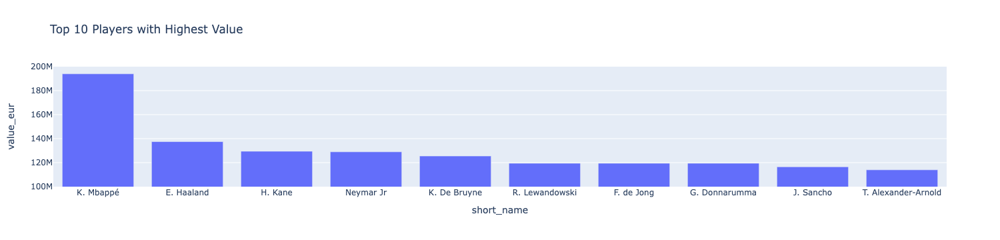

In [78]:

g = px.bar(value, x ='short_name' , y = 'value_eur', title = 'Top 10 Players with Highest Value')
g.update(layout_yaxis_range= [100000000,200000000])

## Oldest Players

In [79]:
Oldest_player = df.sort_values(by = 'age' , ascending = False)[['short_name','club_name','nationality_name','overall', 'age' ]].head(10)
Oldest_player

,short_name,club_name,nationality_name,overall,age
3105,C. Lucchetti,Atlético Tucumán,Argentina,72,43
388,G. Buffon,Parma,Italy,80,43
10042,D. Vaca,Club The Strongest,Bolivia,65,42
17435,K. Stamatopoulos,AIK,Canada,56,41
2741,S. Torrico,San Lorenzo de Almagro,Argentina,73,41
4594,A. Boruc,Legia Warszawa,Poland,70,41
12437,S. Lukić,Varbergs BoIS FC,Bosnia and Herzegovina,63,41
13023,J. Pinto,Sport Huancayo,Peru,63,41
4595,G. Pegolo,U.S. Sassuolo Calcio,Italy,70,40
3828,N. Penneteau,Stade de Reims,France,71,40


## The Best Dribblers
> Q. Who are the best Dribblers?

> which country and club has the best dribblers on average

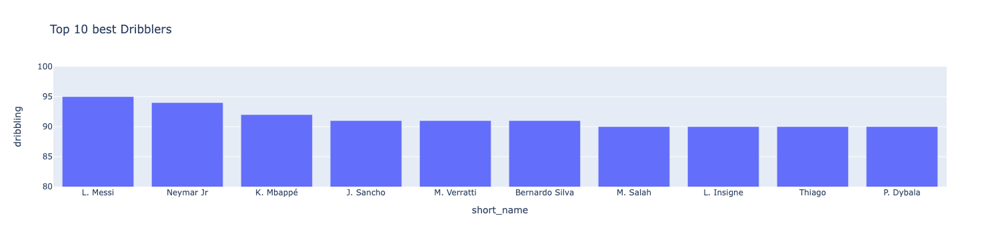

In [80]:
dribblers = df.sort_values(by = 'dribbling' , ascending = False)[['short_name','club_name','nationality_name','age','dribbling']].head(10)
g = px.bar(dribblers, x ='short_name' , y = 'dribbling', title = 'Top 10 best Dribblers')
g.update(layout_yaxis_range= [80,100])

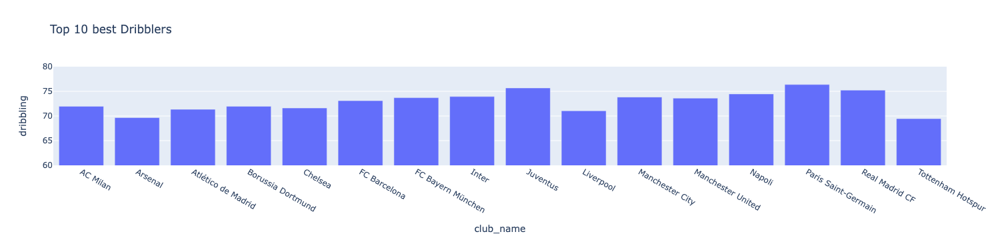

In [81]:
club_dribblers = df[df['club_name'].isin(top_clubs)].groupby('club_name', as_index = False)['dribbling'].mean()
g = px.bar(club_dribblers, x ='club_name' , y = 'dribbling', title = 'Top 10 best Dribblers')
g.update(layout_yaxis_range= [60,80])

> It can be seen that PSG players has the best dribbling skills on average, followed by Juventus and Real Madrid

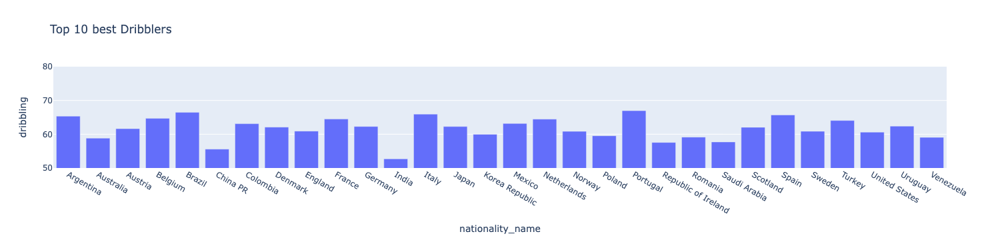

In [82]:
nationality_dribblers = df[df['nationality_name'].isin(df.nationality_name.value_counts().head(30).index)].groupby('nationality_name', as_index = False)['dribbling'].mean()
g = px.bar(nationality_dribblers, x ='nationality_name' , y = 'dribbling', title = 'Top 10 best Dribblers')
g.update(layout_yaxis_range= [50,80])

> It can be seen that Porgueese, Brazilian and Argentinian  players has the best dribbling skills on average.

## BEST FREEKICK TAKERS

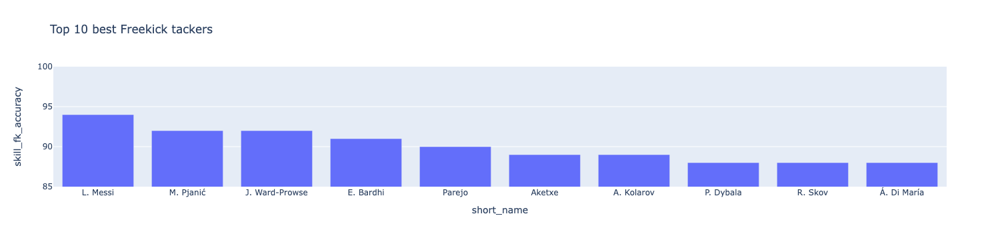

In [83]:
dribblers = df.sort_values(by = 'skill_fk_accuracy' , ascending = False)[['short_name','club_name','nationality_name','age','skill_fk_accuracy']].head(10)
g = px.bar(dribblers, x ='short_name' , y = 'skill_fk_accuracy', title = 'Top 10 best Freekick tackers')
g.update(layout_yaxis_range= [85,100])

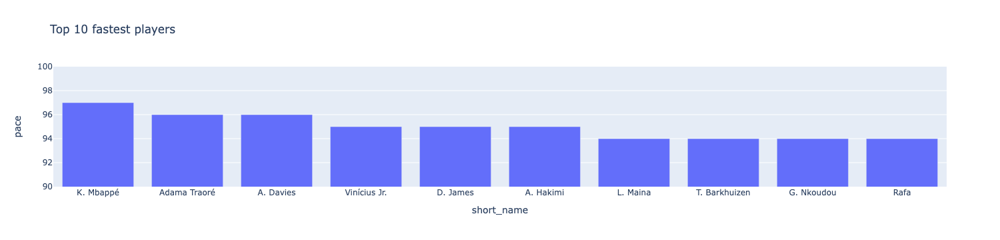

In [84]:
pace = df.sort_values(by = 'pace' , ascending = False)[['short_name','club_name','nationality_name','age','pace']].head(10)
g = px.bar(pace, x ='short_name' , y = 'pace', title = 'Top 10 fastest players')
g.update(layout_yaxis_range= [90,100])

## The Best Finisher
> Q. Who is the best finisher?


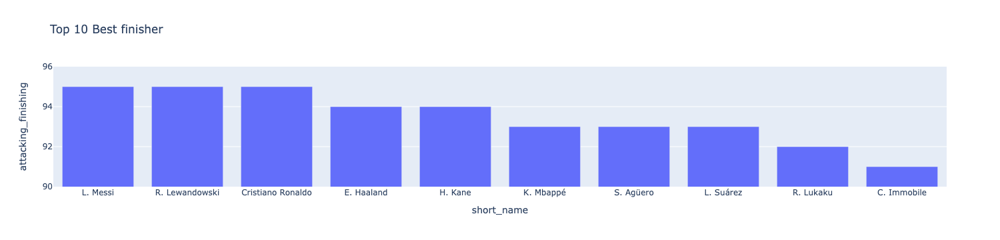

In [85]:
best_finisher = df.sort_values(by = 'attacking_finishing' , ascending = False)[['short_name','club_name','nationality_name','age','attacking_finishing']].head(10)
g = px.bar(best_finisher, x ='short_name' , y = 'attacking_finishing', title = 'Top 10 Best finisher')
g.update(layout_yaxis_range= [90,96])

In [86]:
df.columns

Index(['short_name', 'player_positions', 'overall', 'potential', 'value_eur',
       'wage_eur', 'age', 'dob', 'height_cm', 'weight_kg', 'club_name',
       'league_name', 'league_level', 'club_position', 'club_jersey_number',
       'club_contract_valid_until', 'nationality_id', 'nationality_name',
       'preferred_foot', 'weak_foot', 'skill_moves',
       'international_reputation', 'work_rate', 'body_type',
       'release_clause_eur', 'player_traits', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_lon

# EPL ANALYSIS

In [87]:
EPL = df[df['league_name'].isin(['English Premier League'])]
EPL.shape

(652, 94)

> There are 652 players playing in EPl in the dataset

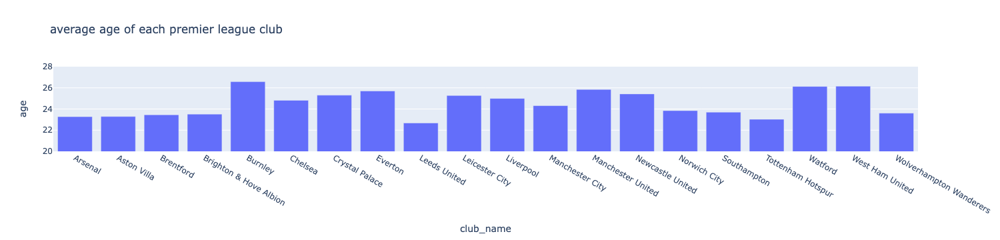

In [88]:
average_age = EPL.groupby('club_name', as_index = False)['age'].mean()
g = px.bar(average_age, x = 'club_name', y = 'age' , title = 'average age of each premier league club')
g.update(layout_yaxis_range= [20,28])

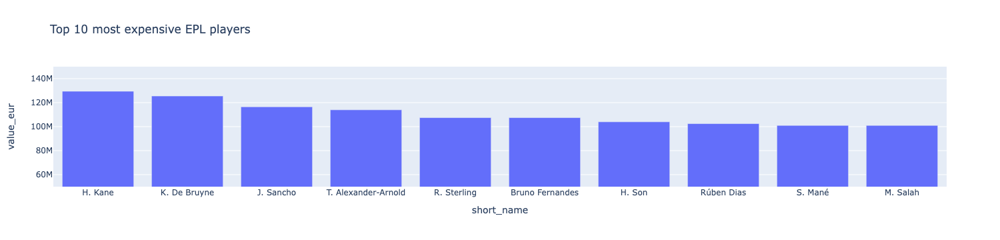

In [89]:
mvp = EPL.sort_values(by = 'value_eur', ascending = False).head(10)
g = px.bar(mvp, x = 'short_name', y = 'value_eur' , title = 'Top 10 most expensive EPL players')
g.update(layout_yaxis_range= [50000000,150000000])


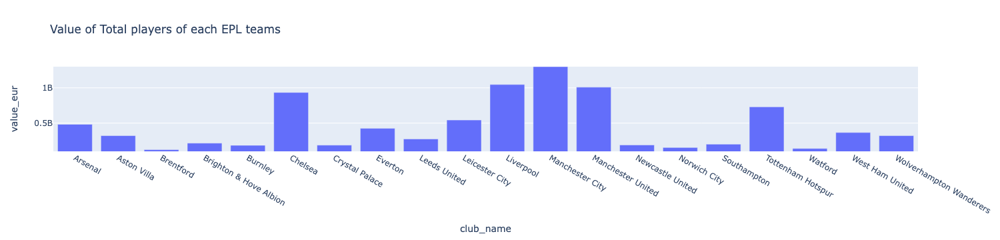

In [90]:
club_value = EPL.groupby('club_name', as_index = False)['value_eur'].sum()
g = px.bar(club_value, x = 'club_name', y = 'value_eur' , title = 'Value of Total players of each EPL teams')
g.update(layout_yaxis_range= [100000000,1300000000])

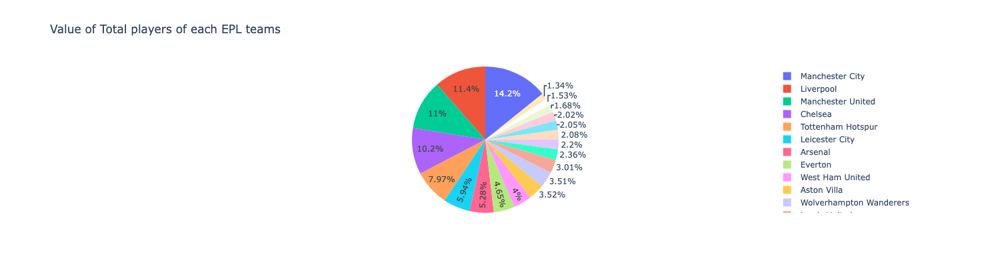

In [91]:
labels = club_value['club_name']
size = club_value['value_eur']
g = px.pie(club_value, values = size, names = labels, width=1000, height=400, title = 'Value of Total players of each EPL teams')
g.show()

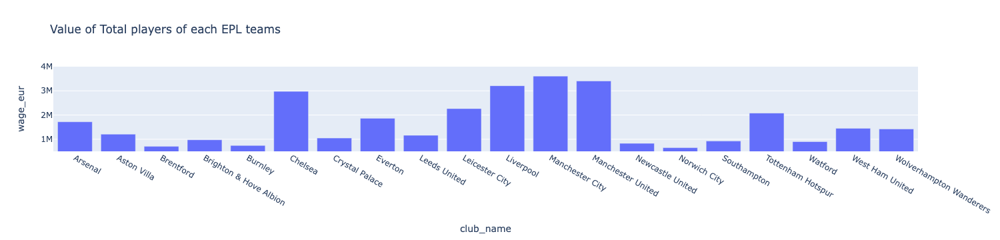

In [92]:
club_wage = EPL.groupby('club_name', as_index = False)['wage_eur'].sum()
g = px.bar(club_wage, x = 'club_name', y = 'wage_eur' , title = 'Value of Total players of each EPL teams')
g.update(layout_yaxis_range= [500000,4000000])

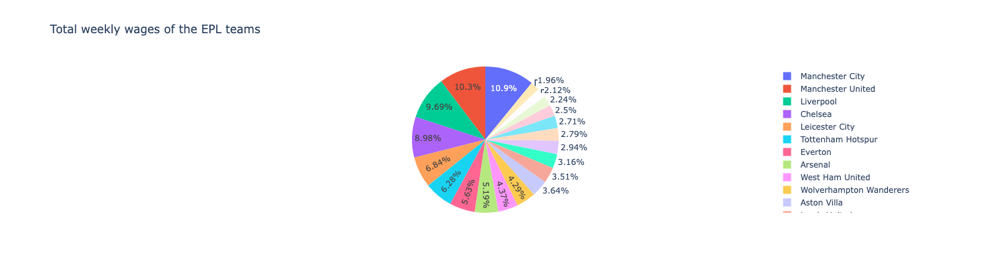

In [93]:
labels = club_wage['club_name']
size = club_wage['wage_eur']
g = px.pie(club_wage, values = size, names = labels, width=1000, height=400, title = 'Total weekly wages of the EPL teams')
g.show()

> Norwich has the least weekly wage bill with 649K followed by Brentford with 704k, While Manchester City has the highest with 3.61M weeekly wage bill 

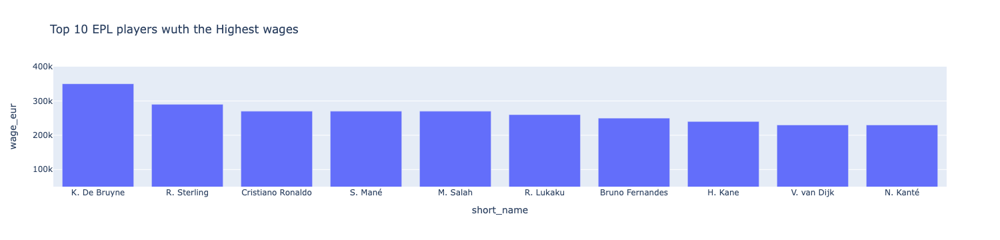

In [94]:
player_wage = EPL.sort_values(by = 'wage_eur', ascending = False).head(10)
g = px.bar(player_wage, x = 'short_name', y = 'wage_eur' , title = 'Top 10 EPL players wuth the Highest wages')
g.update(layout_yaxis_range= [50000,400000])

# ANALYSIS OF NIGERIAN PLAYERS

In [97]:
Nigerians = df[df['nationality_name'] == 'Nigeria']

In [98]:
Nigerians.shape

(125, 94)

>There are 125 Nigerian Players in the dataset

In [99]:
Nigerians.head()

,short_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
91,W. Ndidi,"CDM, CM",85,88,66500000.0,120000.0,24,1996-12-16,183,74,...,83+2,83+2,83+2,79+2,80+2,84+2,84+2,84+2,80+2,20+2
491,V. Osimhen,ST,80,87,43000000.0,66000.0,22,1998-12-29,185,78,...,56+2,56+2,56+2,59+2,56+2,54+2,54+2,54+2,56+2,18+2
589,P. Onuachu,ST,79,80,20500000.0,23000.0,27,1994-05-28,201,93,...,61+2,61+2,61+2,57+2,56+2,59+2,59+2,59+2,56+2,17+2
673,V. Moses,"RM, RWB",78,78,13500000.0,56000.0,30,1990-12-12,177,79,...,73+2,73+2,73+2,75+2,74+2,71+2,71+2,71+2,74+2,19+2
795,K. Iheanacho,"ST, CF",78,82,20500000.0,83000.0,24,1996-10-03,185,82,...,58+2,58+2,58+2,58+2,55+2,52+2,52+2,52+2,55+2,17+2


In [100]:
Nigerians['positions'] = Nigerians['player_positions'].map(lambda x:x.split(',')[0])

## Distribution of the position

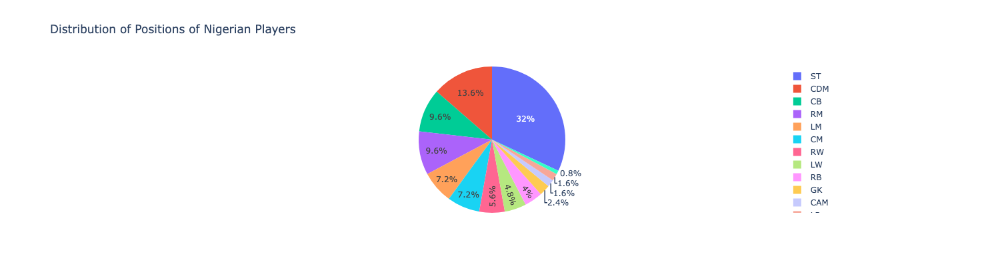

In [101]:
labels = Nigerians['positions'].value_counts().index
size = Nigerians['positions'].value_counts()
g = px.pie(Nigerians, values = size, names = labels, width=1000, height=400, title='Distribution of Positions of Nigerian Players')
g.show()

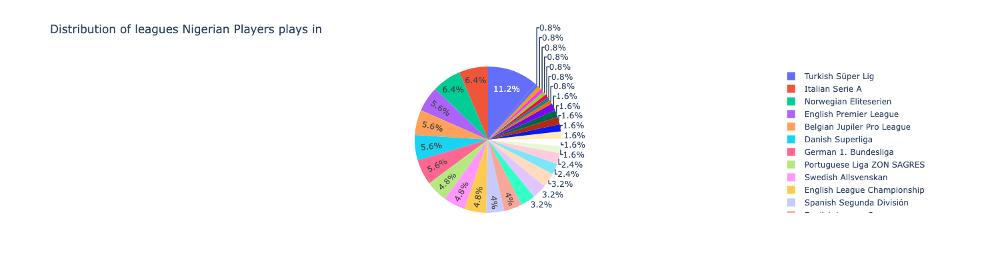

In [102]:
labels = Nigerians['league_name'].value_counts().index
size = Nigerians['league_name'].value_counts()
g = px.pie(Nigerians, values = size, names = labels, width=1000, height=400, title='Distribution of leagues Nigerian Players plays in')
g.show()

>The Pie chart shows the league with most Nigerian players is Turkish Super Lig with 14 Nigerian players which accounts to 11.2% of the total Nigerian players in the dataset, followed by Norwegian eliteserien and Italian Serie A with 8 Nigerian Players each and the famous EPL, Danish superliga, belgian Jupiler Pro league and German 1. Bundesliga with 7 players each

>The Pie chart above shows Most nigerians players plays as a stricker

## PREFERRED FOOT

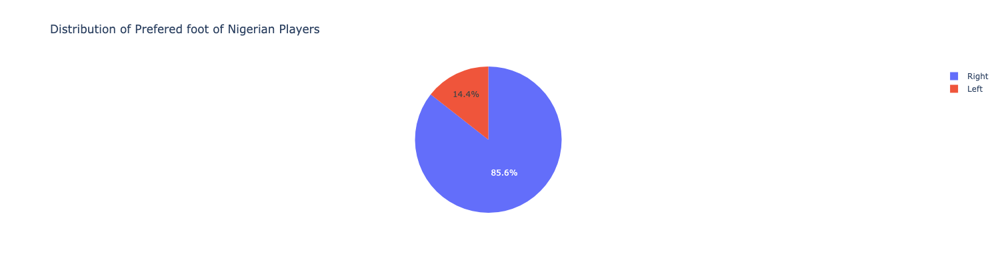

In [103]:
labels = Nigerians['preferred_foot'].value_counts().index
size = Nigerians['preferred_foot'].value_counts()
g = px.pie(Nigerians, values = size, names = labels, width=1000, height=400, title='Distribution of Prefered foot of Nigerian Players')
g.show()

> 85% of Nigerian Players are right footed

## AGE OF NIGERIAN PLAYERS

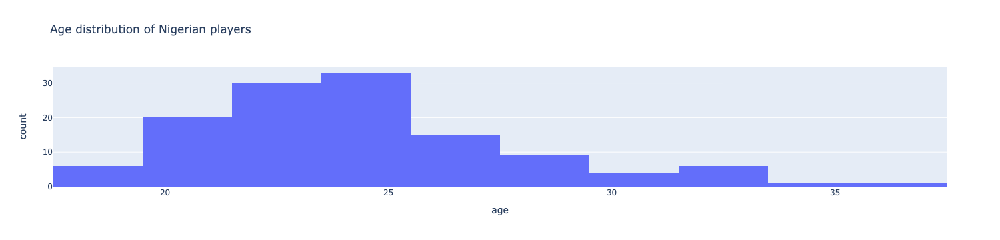

In [104]:
px.histogram(Nigerians, 'age', title = 'Age distribution of Nigerian players')

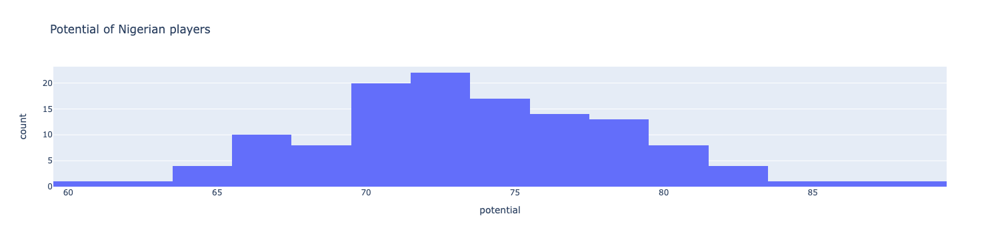

In [105]:
px.histogram(Nigerians, 'potential', title = 'Potential of Nigerian players')

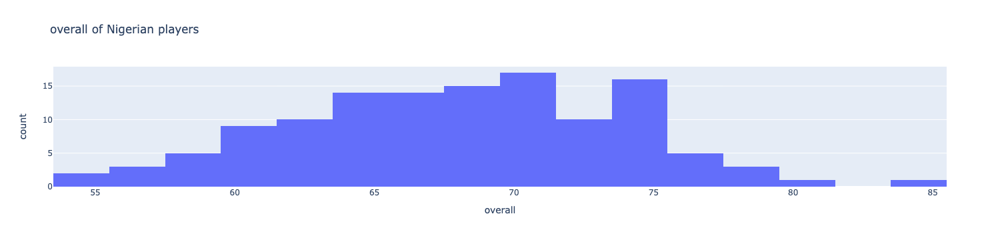

In [106]:
px.histogram(Nigerians, 'overall', title = 'overall of Nigerian players')

## NIGERIANS TOP PLAYERS

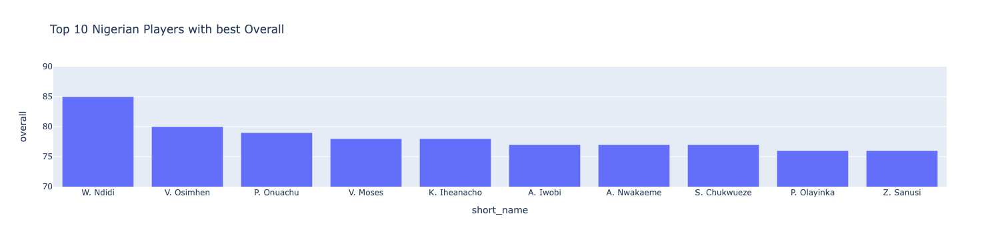

<Figure size 864x432 with 0 Axes>

In [107]:
best_players = Nigerians.sort_values(by ='overall',ascending = False ).head(10)
plt.figure(1,figsize = (12,6))
g = px.bar(best_players, x ='short_name' , y = 'overall', title = 'Top 10 Nigerian Players with best Overall')
g.update(layout_yaxis_range= [70,90])

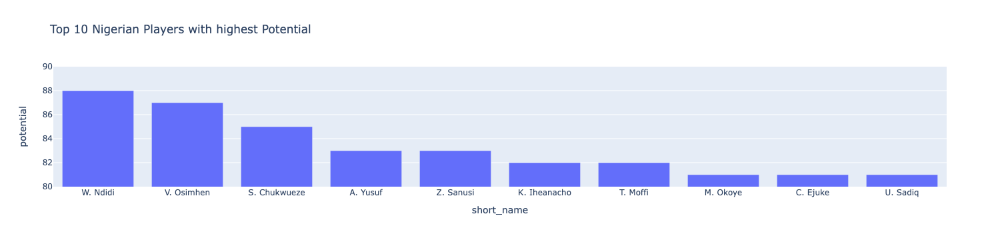

<Figure size 864x432 with 0 Axes>

In [108]:
potential = Nigerians.sort_values(by ='potential',ascending = False ).head(10)
plt.figure(1,figsize = (12,6))
g = px.bar(potential, x ='short_name' , y = 'potential', title = 'Top 10 Nigerian Players with highest Potential')
g.update(layout_yaxis_range= [80,90])

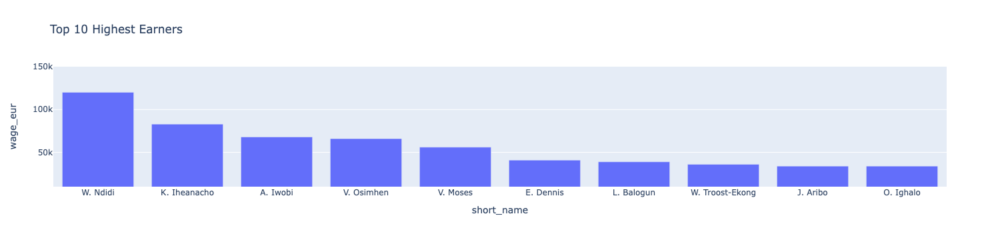

<Figure size 864x432 with 0 Axes>

In [109]:
wage = Nigerians.sort_values(by ='wage_eur',ascending = False ).head(10)
plt.figure(1,figsize = (12,6))
g = px.bar(wage, x ='short_name' , y = 'wage_eur', title = 'Top 10 Highest Earners')
g.update(layout_yaxis_range= [10000,150000])

> Wilfried Ndidi is the highjest Nigerian footballer earner folowed by Kelechi Iheanacho and Iwobi

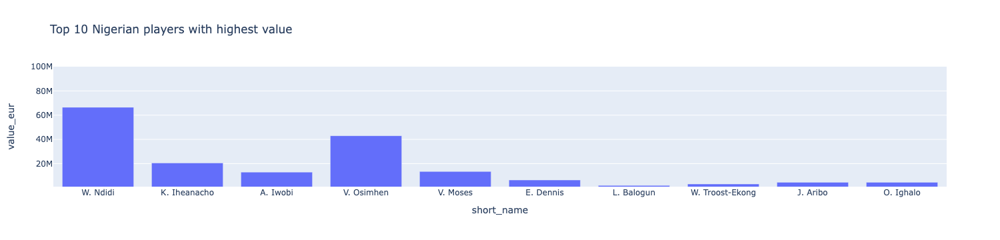

<Figure size 864x432 with 0 Axes>

In [110]:
value = Nigerians.sort_values(by ='value_eur',ascending = False ).head(10)
plt.figure(1,figsize = (12,6))
g = px.bar(wage, x ='short_name' , y = 'value_eur', title = 'Top 10 Nigerian players with highest value')
g.update(layout_yaxis_range= [1000000,100000000])

## Nigeria Best Attackers

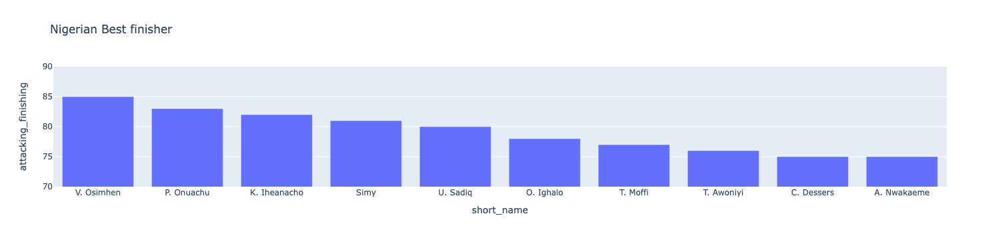

In [111]:
best_finisher = Nigerians.sort_values(by = 'attacking_finishing' , ascending = False)[['short_name','club_name','nationality_name','age','attacking_finishing']].head(10)
g = px.bar(best_finisher, x ='short_name' , y = 'attacking_finishing', title = 'Nigerian Best finisher')
g.update(layout_yaxis_range= [70,90])

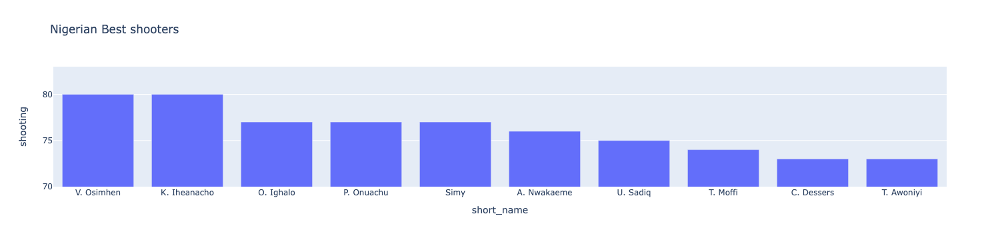

In [112]:
best_shooting = Nigerians.sort_values(by = 'shooting' , ascending = False)[['short_name','club_name','nationality_name','age','shooting']].head(10)
g = px.bar(best_shooting, x ='short_name' , y = 'shooting', title = 'Nigerian Best shooters')
g.update(layout_yaxis_range= [70,83])

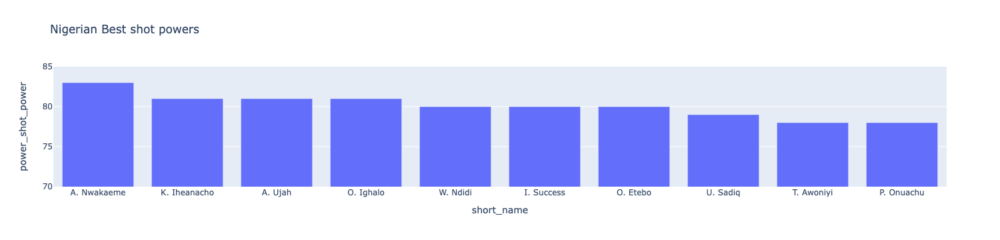

In [113]:
power_shot_power = Nigerians.sort_values(by = 'power_shot_power' , ascending = False)[['short_name','club_name','nationality_name','age','power_shot_power']].head(10)
g = px.bar(power_shot_power, x ='short_name' , y = 'power_shot_power', title = 'Nigerian Best shot powers')
g.update(layout_yaxis_range= [70,85])

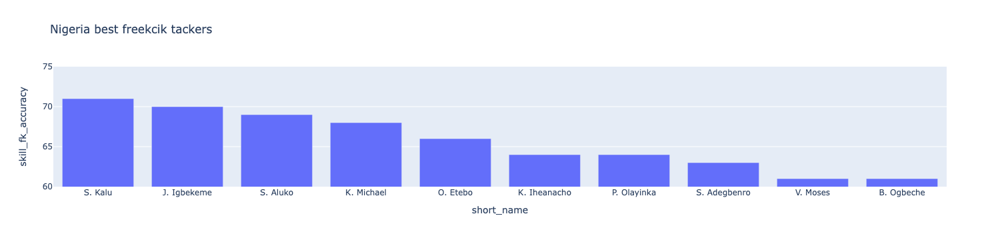

In [114]:
freekick = Nigerians.sort_values(by = 'skill_fk_accuracy' , ascending = False)[['short_name','club_name','nationality_name','age','skill_fk_accuracy']].head(10)
g = px.bar(freekick, x ='short_name' , y = 'skill_fk_accuracy', title = 'Nigeria best freekcik tackers')
g.update(layout_yaxis_range= [60, 75])

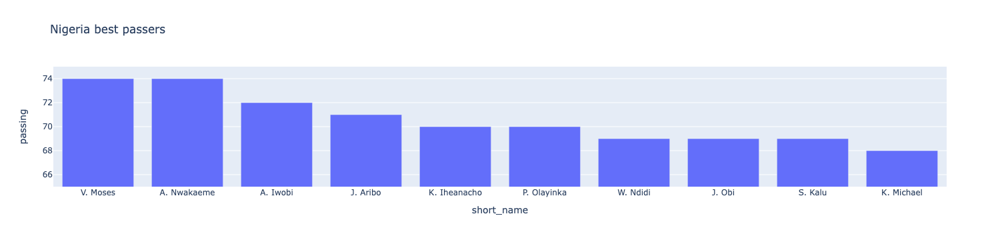

In [115]:
passers = Nigerians.sort_values(by = 'passing' , ascending = False)[['short_name','club_name','nationality_name','age','passing']].head(10)
g = px.bar(passers, x ='short_name' , y = 'passing', title = 'Nigeria best passers')
g.update(layout_yaxis_range= [65, 75])

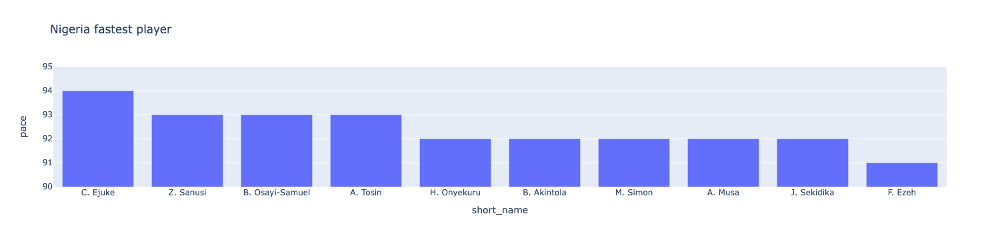

In [116]:
pace = Nigerians.sort_values(by = 'pace' , ascending = False)[['short_name','club_name','nationality_name','age','pace']].head(10)
g = px.bar(pace, x ='short_name' , y = 'pace', title = 'Nigeria fastest player')
g.update(layout_yaxis_range= [90, 95])

In [117]:
Nigerians.columns

Index(['short_name', 'player_positions', 'overall', 'potential', 'value_eur',
       'wage_eur', 'age', 'dob', 'height_cm', 'weight_kg', 'club_name',
       'league_name', 'league_level', 'club_position', 'club_jersey_number',
       'club_contract_valid_until', 'nationality_id', 'nationality_name',
       'preferred_foot', 'weak_foot', 'skill_moves',
       'international_reputation', 'work_rate', 'body_type',
       'release_clause_eur', 'player_traits', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_lon

## Predicting the overall of players

In [118]:
df2 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_21.csv')

In [119]:
df22 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_22.csv')[['sofifa_id', 'short_name', 'long_name','overall', 'age']]

In [120]:
df22.head(50)

,sofifa_id,short_name,long_name,overall,age
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,93,34
1,188545,R. Lewandowski,Robert Lewandowski,92,32
2,20801,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,91,36
3,190871,Neymar Jr,Neymar da Silva Santos Júnior,91,29
4,192985,K. De Bruyne,Kevin De Bruyne,91,30
5,200389,J. Oblak,Jan Oblak,91,28
6,231747,K. Mbappé,Kylian Mbappé Lottin,91,22
7,167495,M. Neuer,Manuel Peter Neuer,90,35
8,192448,M. ter Stegen,Marc-André ter Stegen,90,29
9,202126,H. Kane,Harry Kane,90,27


In [121]:
df21 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_21.csv')
df20 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_20.csv')
df19 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_19.csv')
df18 = pd.read_csv('/Users/abubakri/Downloads/archive (1)/players_18.csv')
df21['overall21'] = df21['overall']
df20['overall20'] = df21['overall']
df19['overall19'] = df21['overall']
df18['overall18'] = df21['overall']
df21 = df21[['sofifa_id','overall21']]
df20 = df20[['sofifa_id','overall20']]
df19 = df19[['sofifa_id','overall19']]
df18 = df18[['sofifa_id','overall18']]
df18.drop_duplicates(inplace = True)
df20.drop_duplicates(inplace = True)

In [122]:
df20.duplicated().sum()

0

In [123]:
df_18_22 = pd.merge(df22,
                    pd.merge(df21, 
                         pd.merge(df20,
                             pd.merge(df19, df18,
                                     on = 'sofifa_id' ), on = 'sofifa_id'), 
                                             on = 'sofifa_id' ), on = 'sofifa_id')

In [124]:
df_18_22.dropna(inplace = True)

In [125]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_squared_error

In [126]:
x = df_18_22.iloc[:, 4:]
y = df_18_22.iloc[:, 3]

In [127]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 14)

In [128]:
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test =  scaler.transform(x_test)

In [129]:
model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test).reshape(-1, 1)


In [130]:
model.score(x_test, y_test)

0.8941506554763347

In [131]:
model.score(x_train, y_train)

0.8952753241087777

In [132]:
mean_squared_error(y_test, y_pred)

3.4045262023103717

<AxesSubplot:xlabel='overall', ylabel='Density'>

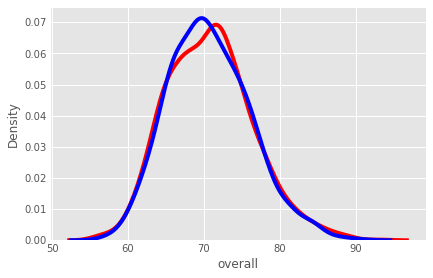

In [133]:
ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values" , ax=ax1)

> predict for 2023

In [134]:
df23 = df_18_22.copy()
df23['age'] = df23['age'].map(lambda x: x+1)

In [135]:
df23['overall23'] = model.predict(scaler.transform(df23.loc[:, [ 'age', 'overall', 'overall21', 'overall20', 'overall19']]))
df23['overall23'] = df23['overall23'].map( lambda x: round(x))

>predicted overall for players 2023

In [136]:
df23[['short_name', 'age', 'overall23']].head(20)

,short_name,age,overall23
0,L. Messi,35,91
1,R. Lewandowski,33,90
2,Cristiano Ronaldo,37,89
3,Neymar Jr,30,90
4,K. De Bruyne,31,89
5,J. Oblak,29,90
6,K. Mbappé,23,91
7,M. Neuer,36,88
8,M. ter Stegen,30,89
9,H. Kane,28,89
